### Safegraph Foot Traffic - Correlations

Authors: Anuj Agarwal

The purpose of this notebook is to analyze and determine whether business sales data can be used as an appropriate proxy for foot traffic data using Hilo 2023 as a case study.


#### Imports


In [1]:
%load_ext autoreload
%autoreload 2

# Third-party imports
import geopandas as gpd
import pandas as pd

# Application Imports
from utils.constants import DATA_DIR
from utils.infogroup import (
    aggregate_stats_by_region,
    get_city_records,
    plot_region_stat_correlation,
)

#### Processing Infogroup Business Sales

{description}


In [2]:
# Load and preview dataset
info_df = get_city_records(
    fpath=f"{DATA_DIR}/2023_Business_Academic_QCQ.txt", city="HILO", state="HI"
)
info_df.head()

,COMPANY,ADDRESS LINE 1,CITY,STATE,ZIPCODE,ZIP4,COUNTY CODE,AREA CODE,IDCODE,LOCATION EMPLOYEE SIZE CODE,...,POPULATION CODE,CENSUS TRACT,CENSUS BLOCK,LATITUDE,LONGITUDE,MATCH CODE,CBSA CODE,CBSA LEVEL,CSA CODE,FIPS CODE
4161,NaN,200 W KAWILI ST,HILO,HI,96720.0,4075.0,1.0,808.0,1,A,...,7,20500.0,5.0,19.699198,-155.081821,P,25900.0,1.0,0.0,15001.0
5236,QUILL & FEATHER,75 LUNAPULE ROAD 159,HILO,HI,96720.0,NaN,1.0,808.0,2,A,...,7,20400.0,2.0,19.717275,-155.085635,X,25900.0,1.0,0.0,15001.0
5246,AIWOHI & CO LLC,688 KINOOLE ST # 202,HILO,HI,96720.0,3815.0,1.0,808.0,2,NaN,...,7,20400.0,2.0,19.717684,-155.084726,P,25900.0,1.0,0.0,15001.0
5253,LANCASTER REAL PROPERTY NINOLE,50 LUANA WAY,HILO,HI,96720.0,1821.0,1.0,808.0,2,A,...,7,20802.0,2.0,19.702025,-155.111379,P,25900.0,1.0,0.0,15001.0
5410,BARNES HUNT INC,868 ULULANI ST # 101,HILO,HI,96720.0,3913.0,1.0,808.0,1,A,...,7,20400.0,2.0,19.716687,-155.085933,P,25900.0,1.0,0.0,15001.0


In [3]:
info_df.columns

Index(['COMPANY', 'ADDRESS LINE 1', 'CITY', 'STATE', 'ZIPCODE', 'ZIP4',
       'COUNTY CODE', 'AREA CODE', 'IDCODE', 'LOCATION EMPLOYEE SIZE CODE',
       'LOCATION SALES VOLUME CODE', 'PRIMARY SIC CODE', 'SIC6_DESCRIPTIONS',
       'PRIMARY NAICS CODE', 'NAICS8 DESCRIPTIONS', 'SIC CODE',
       'SIC6_DESCRIPTIONS (SIC)', 'SIC CODE 1', 'SIC6_DESCRIPTIONS (SIC1)',
       'SIC CODE 2', 'SIC6_DESCRIPTIONS(SIC2)', 'SIC CODE 3',
       'SIC6_DESCRIPTIONS(SIC3)', 'SIC CODE 4', 'SIC6_DESCRIPTIONS(SIC4)',
       'ARCHIVE VERSION YEAR', 'YELLOW PAGE CODE',
       'EMPLOYEE SIZE (5) - LOCATION', 'SALES VOLUME (9) - LOCATION',
       'BUSINESS STATUS CODE', 'INDUSTRY SPECIFIC FIRST BYTE',
       'YEAR ESTABLISHED', 'OFFICE SIZE CODE', 'COMPANY HOLDING STATUS', 'ABI',
       'SUBSIDIARY NUMBER', 'PARENT NUMBER', 'PARENT ACTUAL EMPLOYEE SIZE',
       'PARENT ACTUAL SALES VOLUME', 'PARENT EMPLOYEE SIZE CODE',
       'PARENT SALES VOLUME CODE', 'SITE NUMBER', 'ADDRESS TYPE INDICATOR',
       'POPULAT

In [4]:
# Convert to GeoDataFrame and preview
info_gdf = gpd.GeoDataFrame(
    info_df,
    geometry=gpd.points_from_xy(x=info_df["LONGITUDE"], y=info_df["LATITUDE"]),
    crs="EPSG:4326",
)
info_gdf[["COMPANY", "geometry"]].explore()

In [5]:
# Remove businesses extraneously marked as being in Hilo
hilo_boundary = gpd.read_file(f"{DATA_DIR}/hilo_fixed.geojson")
info_gdf = info_gdf[info_gdf.intersects(hilo_boundary.iloc[0]["geometry"])]
info_gdf[["COMPANY", "geometry"]].explore()

#### Process SafeGraph Foot Traffic Data

We can visulaize the foot traffice data in Hilo and examine if there is any correlation between foot traffic data and business sales.


In [6]:
# Load and preview dataset
safegraph_df = pd.read_parquet(
    f"{DATA_DIR}/foot-traffic/hilo_full_patterns.parquet"
)
safegraph_gdf = gpd.GeoDataFrame(
    safegraph_df,
    geometry=gpd.points_from_xy(
        x=safegraph_df["longitude"], y=safegraph_df["latitude"]
    ),
    crs="EPSG:4326",
)
safegraph_gdf[["location_name", "geometry"]].explore()

#### Examine Correlations by Geographic Region


In [7]:
# Aggregate stats by geographic region
region_stats = aggregate_stats_by_region(info_gdf, safegraph_gdf)
region_stats.head()

/home/launagreer/clinic/2024-winter-perpetual/env/lib/python3.11/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,geographic_region,sales_volume,raw_visit_counts,log_raw_visit_counts,log_sales_volume
0,1,0,1969,7.585789,0.000000
1,7,564,0,0.000000,6.336826
2,8,0,80,4.394449,0.000000
3,11,14232,21817,9.990491,9.563318
4,12,19270,30275,10.318111,9.866357


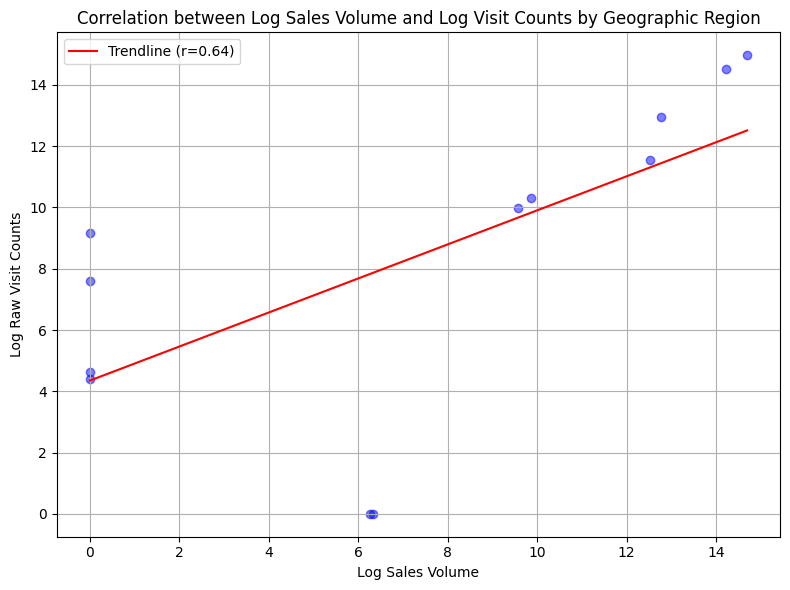

In [8]:
plot_region_stat_correlation(region_stats)

#### Conclusions

- Using Hilo 2023 as a case study, business sales have a strong correlated with foot traffic and ca indeed a be used as a strong proxy for foot traffic.
- Some more optimization and investigation into the amount of regions to split cities into when correlating Business sales and foot traffic is needed to prevent outliers.
